In [1]:
import osmnx as ox

C:\Users\zijun\AppData\Local\Temp\ipykernel_281068\390020393.py:1: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  G_box = ox.graph_from_bbox(37.9841, 37.9768, 23.7294, 23.7363, network_type='drive', simplify=True)
C:\Users\zijun\AppData\Local\Temp\ipykernel_281068\390020393.py:1: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  G_box = ox.graph_from_bbox(37.9841, 37.9768, 23.7294, 23.7363, network_type='drive', simplify=True)


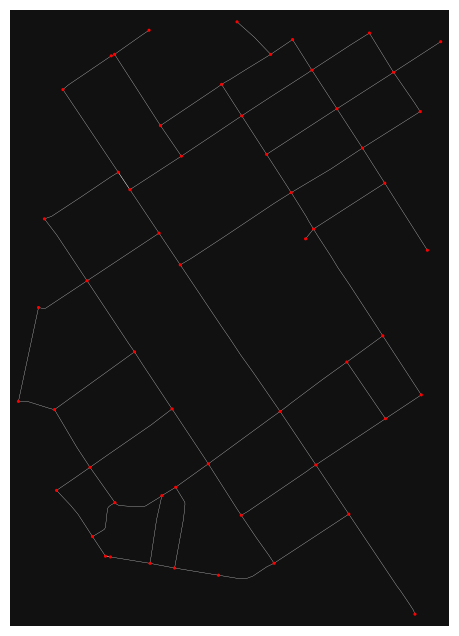

In [36]:
G_box = ox.graph_from_bbox(37.9841, 37.9768, 23.7294, 23.7363, network_type='drive', simplify=True)
fig, ax = ox.plot_graph(G_box, node_size=5, node_color='r', edge_color='w', edge_linewidth=0.2)

In [3]:
nodes, edges = ox.utils_graph.graph_to_gdfs(G_box)
nodes.head()

C:\Users\zijun\AppData\Local\Temp\ipykernel_281068\4015360165.py:1: FutureWarning: The `graph_to_gdfs` function has moved to the `convert` module. Calling `utils_graph.graph_to_gdfs` is deprecated and will be removed in the v2.0.0 release. Call it via `convert.graph_to_gdfs` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  nodes, edges = ox.utils_graph.graph_to_gdfs(G_box)


,y,x,street_count,highway,geometry
osmid,,,,,
250691664,37.981663,23.730205,4,NaN,POINT (23.73021 37.98166)
250691665,37.980915,23.730860,4,NaN,POINT (23.73086 37.98091)
250691666,37.980055,23.731586,3,NaN,POINT (23.73159 37.98006)
250691668,37.978701,23.732719,4,NaN,POINT (23.73272 37.97870)
250691669,37.978079,23.733224,3,NaN,POINT (23.73322 37.97808)


In [4]:
from DataVisualization.readdata import PNeumaDataset
import os

In [5]:
file_path = os.path.join('.\\Data', "20181024", "20181024_d2_0830_0900.csv")
trajs = PNeumaDataset.read_pneuma_csv(file_path)
print(trajs[0])

[(37.979512, 23.733515, 0.0), (37.979516, 23.733512, 0.04), (37.97952, 23.733508, 0.08), (37.979525, 23.733505, 0.12), (37.979529, 23.733502, 0.16), (37.979533, 23.733498, 0.2), (37.979538, 23.733495, 0.24), (37.979542, 23.733492, 0.28), (37.979546, 23.733488, 0.32), (37.97955, 23.733485, 0.36), (37.979554, 23.733481, 0.4), (37.979557, 23.733478, 0.44), (37.979561, 23.733475, 0.48), (37.979564, 23.733472, 0.52), (37.979568, 23.733469, 0.56), (37.979571, 23.733466, 0.6)]


In [6]:
import matplotlib.pyplot as plt

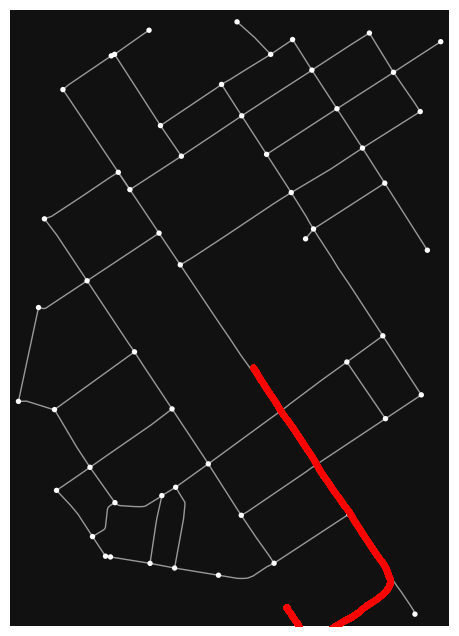

In [7]:
fig, ax = ox.plot_graph(G_box, show=False, close=False)
# Extract latitude and longitude from the trajectory and plot them on the graph
traj_lats = [point[0] for point in trajs[94]]
traj_lons = [point[1] for point in trajs[94]]

ax.scatter(traj_lons, traj_lats, c='red', s=10)  # c for color, s for size of points

plt.show()

In [40]:
import folium

map = folium.Map(location=[37.982347, 23.734783], zoom_start=15)

for point in trajs[94]:
    folium.CircleMarker(
        location=point, # Latitude, Longitude
        radius=1, # Marker size
        color='blue', # Marker color
        fill=True,
        fill_color='red'
    ).add_to(map)
map

In [20]:
from leuvenmapmatching.matcher.distance import DistanceMatcher
from leuvenmapmatching.map.inmem import InMemMap

def build_matching_graph(road_net_graph):
    map_con = InMemMap("myosm", use_latlon=True, use_rtree=True, index_edges=True)

    nodes_id = list(road_net_graph.nodes)
    for node in nodes_id:
        lat = road_net_graph.nodes[node]['y']
        lon = road_net_graph.nodes[node]['x']
        map_con.add_node(node, (lat, lon))

    edges_id = list(road_net_graph.edges)
    for edge in edges_id:
        node_a, node_b = edge[0], edge[1]
        map_con.add_edge(node_a, node_b)
        map_con.add_edge(node_b, node_a)  # Add reverse edge

    map_con.purge()

    return map_con


def match_path_to_graph(map_con, vehicle_loc):
    matcher = DistanceMatcher(map_con, max_dist=100,  # meter
                              min_prob_norm=0.001,
                              non_emitting_length_factor=0.75,
                              obs_noise=50, obs_noise_ne=75,  # meter
                              dist_noise=50,  # meter
                              non_emitting_states=True, only_edges=True)

    states, _ = matcher.match(vehicle_loc)
    nodes = matcher.path_pred_onlynodes

    return states, nodes

In [34]:
map_con = build_matching_graph(G_box)
states, nodes = match_path_to_graph(map_con, [trajs[522][0]])
states

[(250691670, 250706414)]

In [174]:
nodes

[3339821648, 250691723]

In [155]:
print(trajs[94][10000])

(37.97661, 23.734447)


In [187]:
def plot_matched_edges_on_graph(graph, matched_traj):
    fig, ax = ox.plot_graph(graph, show=False, close=False, node_color='r', node_size=5)
    # for node, data in graph.nodes(data=True):
    #     ax.annotate(text=node, xy=(data['x'], data['y']), xytext=(5, 0), textcoords='offset points', horizontalalignment='center', verticalalignment='center',
    #                 size=10, color='white')

    # Extract and plot the matched edges
    for node_a_index, node_b_index in matched_traj:  # Assuming the first two columns hold the matched edge node indices
        node_a_index = int(node_a_index)  # Convert to integer as the indices are stored as floats in the array
        node_b_index = int(node_b_index)  # Convert to integer as the indices are stored as floats in the array

        if graph.has_edge(node_a_index, node_b_index) or graph.has_edge(node_b_index, node_a_index):  # Check if the graph has this edge
            point_a = graph.nodes[node_a_index]
            point_b = graph.nodes[node_b_index]
            ax.plot([point_a['x'], point_b['x']], [point_a['y'], point_b['y']], color='blue', linewidth=2)

    plt.show()

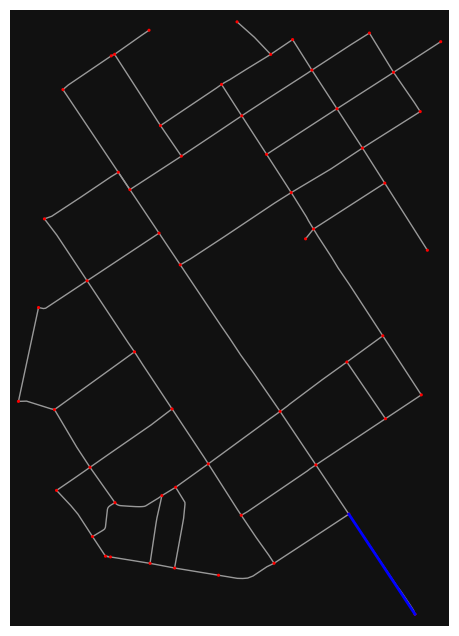

In [188]:
plot_matched_edges_on_graph(G_box,states)

In [191]:
selected_road_paths = [{'A':(250700248,250702474)},
                       {'B': (250702474, 250691664)},
                       {'C': (250702474, 250699983)},
                       {'D': (250699983, 250699984)},
                       {'E': (250699983, 250699982)},
                       {'F': (250699982, 250691665)},
                       {'G': (250699982, 250698926)},
                       {'H': (250698926, 250699613)},
                       {'I': (250698926, 250698924)},
                       {'J': (250698924, 250691668)},
                       {'K': (250698924, 653971690)},
                       {'L': (250698924, 250691724)},
                       {'M': (250691724, 250691669)},
                       {'N': (250691724, 653971685)},
                       {'O': (250691724, 250691723)},
                       {'P': (250691723, 250691670)},
                       {'Q': (250691723, 3339821648)}]

In [195]:
road_paths = [list(v.values())[0] for v in selected_road_paths]
road_paths

[(250700248, 250702474),
 (250702474, 250691664),
 (250702474, 250699983),
 (250699983, 250699984),
 (250699983, 250699982),
 (250699982, 250691665),
 (250699982, 250698926),
 (250698926, 250699613),
 (250698926, 250698924),
 (250698924, 250691668),
 (250698924, 653971690),
 (250698924, 250691724),
 (250691724, 250691669),
 (250691724, 653971685),
 (250691724, 250691723),
 (250691723, 250691670),
 (250691723, 3339821648)]

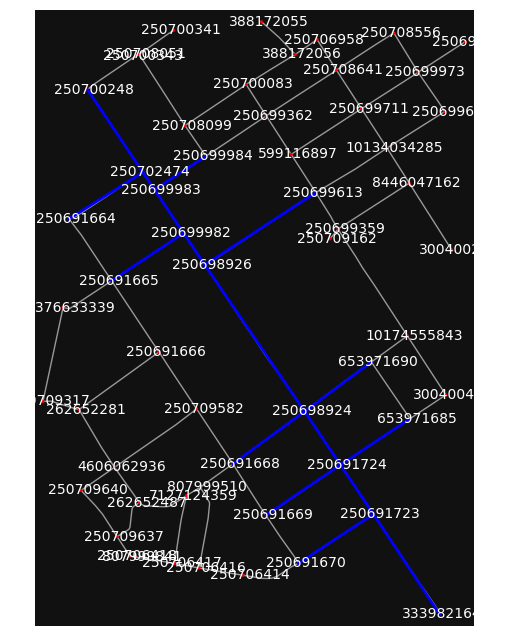

In [123]:
plot_matched_edges_on_graph(G_box,road_paths)

In [196]:
target_tuple = (250702474, 250699983)
# 函数用于找到点对对应的key
def find_key_for_tuple(road_paths, target):
    reversed_target = (target[1], target[0])
    for dictionary in road_paths:
        for key, value in dictionary.items():
            if value == target or value == reversed_target:
                return key
    return None  # 如果没有找到，则返回None

In [197]:
matched_key = find_key_for_tuple(selected_road_paths, target_tuple)
print("Matched Key:", matched_key)

Matched Key: C
